In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from numba import njit, jit
from math import *
import warnings
warnings.filterwarnings('ignore')
export_parallel = True
use_graph = True

In [38]:
image = cv2.imread("data/test.jpg")

In [39]:
print(np.min(image), np.max(image))
print(image.shape)

0 255
(1079, 1919, 3)


In [40]:
@njit(parallel=export_parallel)
def calc_hist(image, maximum_intensity=256):
    hist = []
    for i in range(image.shape[2]):
        hist.append([0 for j in range(maximum_intensity)])
    hist = np.array(hist)
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                hist[i][image[y][x][i]] += 1
    return hist

my_hist = calc_hist(image)

0 0
0 0
0 0


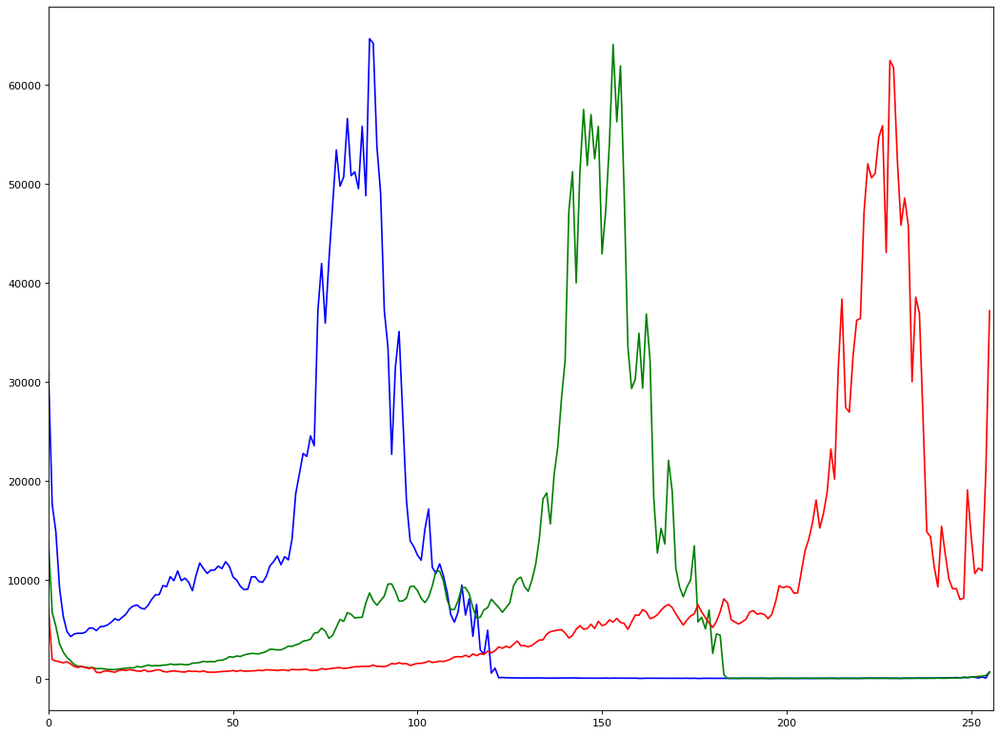

In [41]:
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        hist_cv2 = cv2.calcHist([image],[i],None,[256],[0,256])
        hist_cv2 = np.array([hist_cv2[i][0] for i in range(256)], dtype=int)
        diff = my_hist[i] - hist_cv2
        print(np.min(diff), np.max(diff))
        plt.plot(my_hist[i], color = col)
    plt.xlim([0,256])

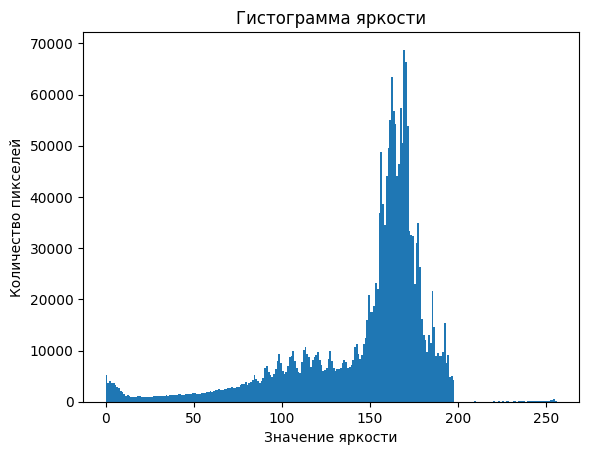

In [42]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

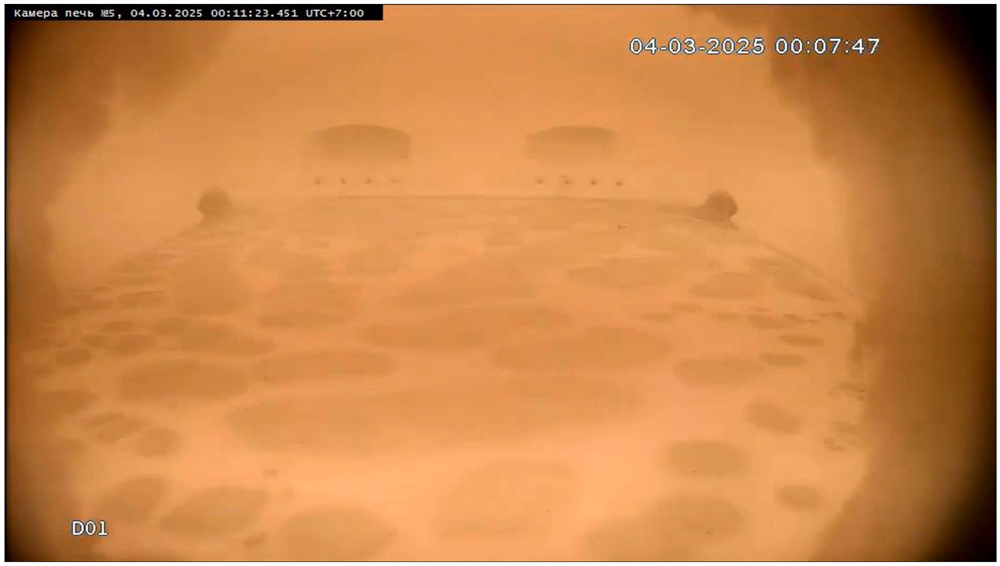

In [43]:
# Исходное изображение
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [44]:
linear_bias = 5 # Величина линейного сдвига интенсивностей
image_linear_bias = np.clip(image + linear_bias, 0, 255) # Ограничу полученую интенсивность снизу 0 и сверху 255
hist_linear_bias = calc_hist(image_linear_bias) # Вычислю гистограмму

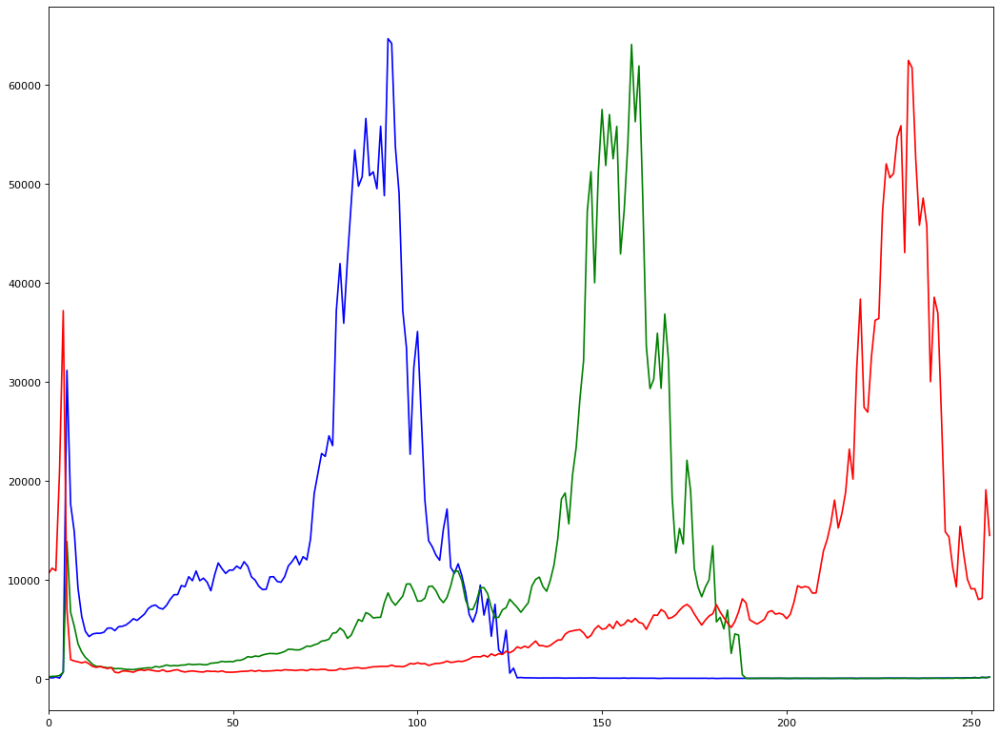

In [45]:
# Отображу полученную после линейного сдвига гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_linear_bias[i], color = col)
    plt.xlim([0,256])

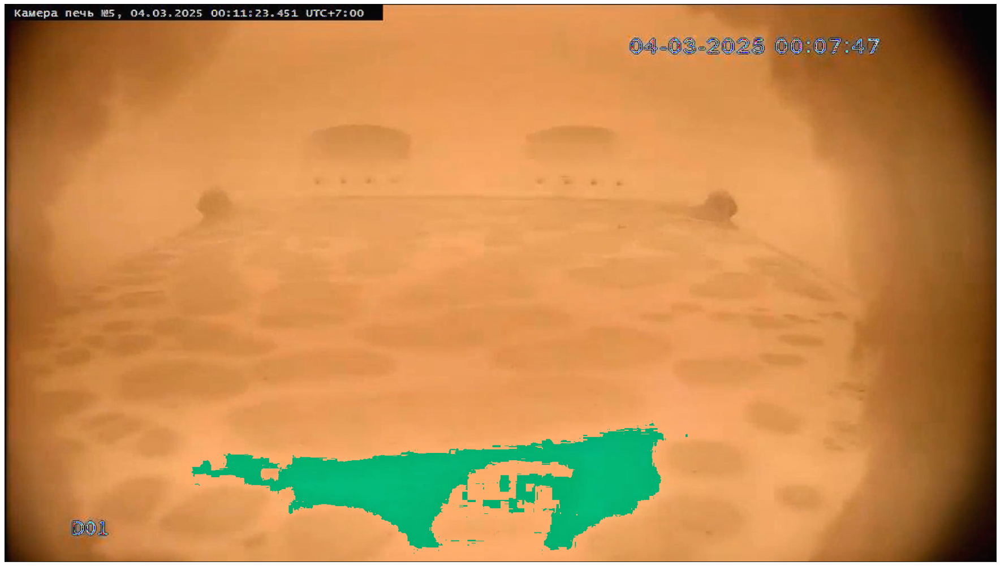

In [46]:
# Изображение после линейного сдвига интенсивностей
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_linear_bias, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [47]:
@njit(parallel=export_parallel)
def calc_nonlinear_stretching(image, alpha, Imin, Imax):
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                image[y,x,i] = 255.0 * np.power((image[y,x,i] - Imin[i]) / (Imax[i] - Imin[i]), alpha)
    return image

In [48]:
alpha = 0.5 # Как просили, возьму это значение

# Вычисление максимальных и минимальных интенсивностей по каждому из каналов
Imin = [np.min(image[:,:,i]) for i in range(image.shape[2])]
Imax = [np.max(image[:,:,i]) for i in range(image.shape[2])]
print(Imin)
print(Imax)

# Вычисление нелинейного преобразования интенсивностей и гистограммы
image_nonlinear_stretching = calc_nonlinear_stretching(np.array(image, dtype=np.float64), alpha, Imin, Imax)

image_nonlinear_stretching = np.round(image_nonlinear_stretching).astype(dtype=np.uint8)
hist_nonlinear_stretching = calc_hist(image_nonlinear_stretching)

[np.uint8(0), np.uint8(0), np.uint8(0)]
[np.uint8(255), np.uint8(255), np.uint8(255)]


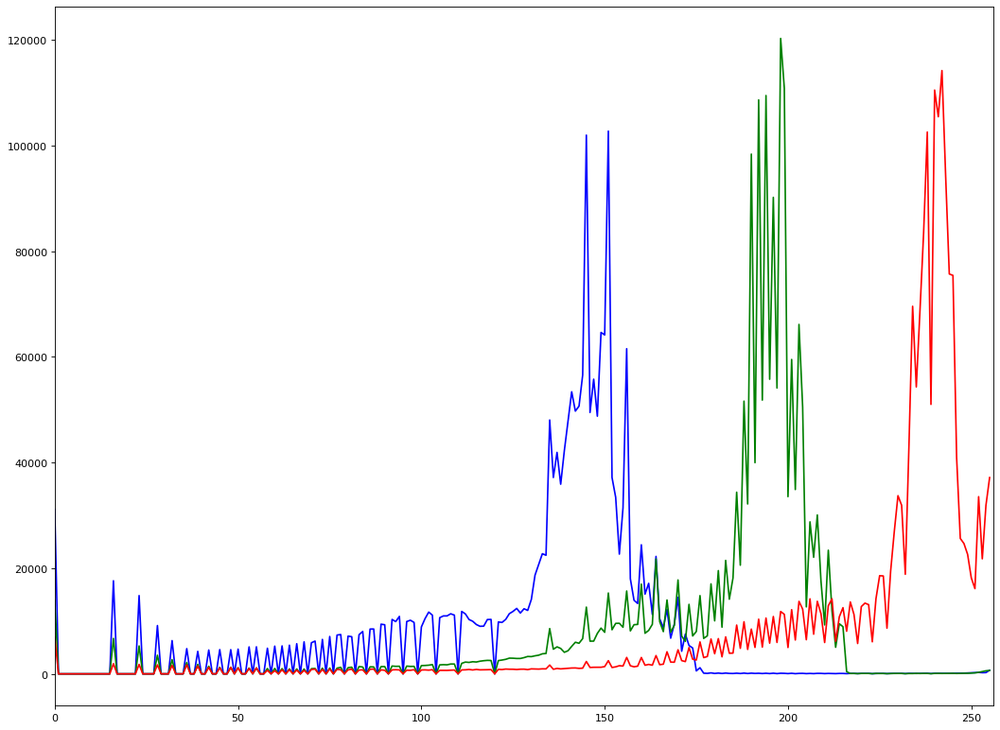

In [49]:
# Отображу полученную после нелинейного преобразования интенсивностей гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_nonlinear_stretching[i], color = col)
    plt.xlim([0,256])

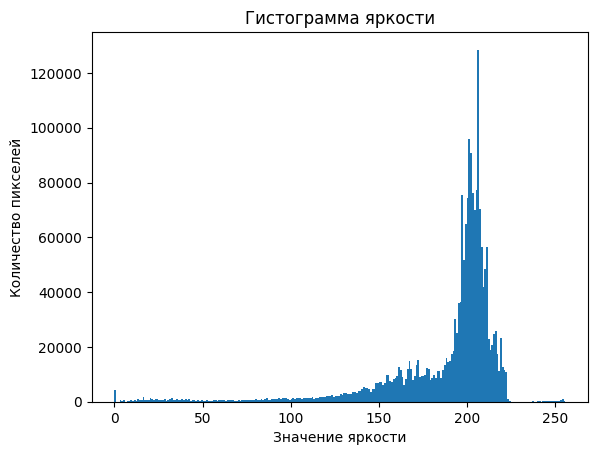

In [50]:
gray_image = cv2.cvtColor(image_nonlinear_stretching, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

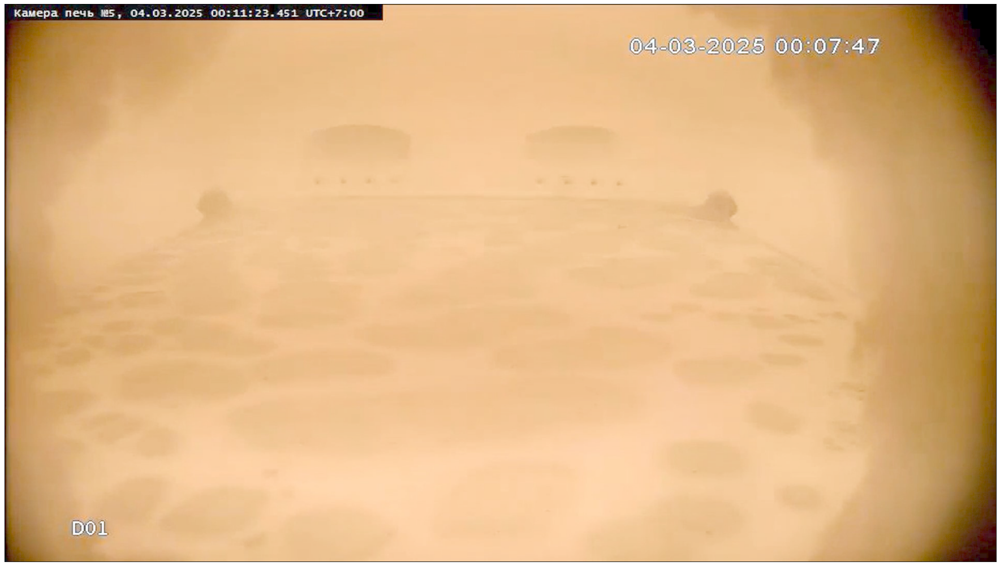

In [51]:
# Изображение после нелинейного преобразования интенсивностей
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_nonlinear_stretching, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [52]:
# Вычисление кумулятивной гистограммы изображения без нормирования
@njit(parallel=export_parallel)
def calc_cumulative_hist(image, maximum_intensity=256):
    hist = []
    for i in range(image.shape[2]):
        hist.append([0 for j in range(maximum_intensity)])
    hist = np.array(hist)
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                hist[i][image[y][x][i]] += 1
        for j in range(maximum_intensity - 1):
            hist[i][j + 1] += hist[i][j]
    return hist

# Применение равномерного преобразования
@njit(parallel=export_parallel)
def apply_cumulative_hist(image, cumulative_hist):
    Imin = [np.min(image[:,:,i]) for i in range(image.shape[2])]
    Imax = [np.max(image[:,:,i]) for i in range(image.shape[2])]
    image_new = np.zeros(image.shape, dtype="uint8")
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                Inew = (Imax[i] - Imin[i]) * cumulative_hist[i][image[y][x][i]] + Imin[i]
                if Inew < 0:
                    Inew = 0
                if Inew > 255:
                    Inew = 255
                image_new[y][x][i] = int(round(Inew))
    return image_new

In [53]:
image_cumulative_hist = calc_cumulative_hist(image)
image_cumulative_hist = image_cumulative_hist.astype(dtype=np.float64) / (image.shape[0] * image.shape[1])
image_uniform_transformation = apply_cumulative_hist(image, image_cumulative_hist)
hist_uniform_transformation = calc_hist(image_uniform_transformation)

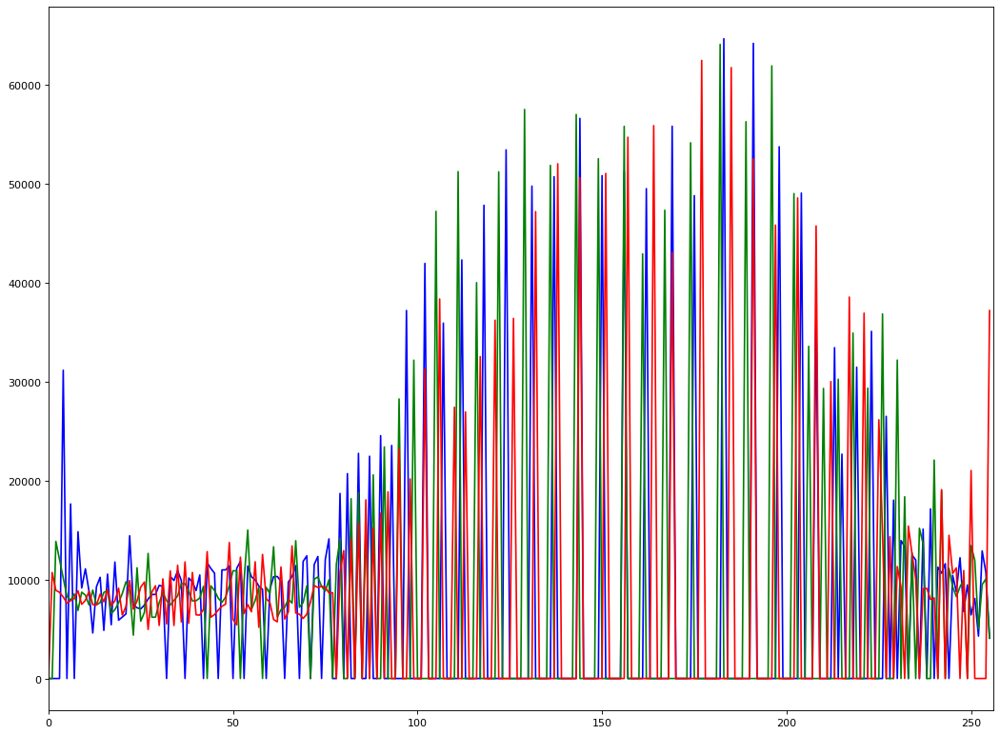

In [54]:
# Отображу полученную после равномерного преобразования интенсивностей гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_uniform_transformation[i], color = col)
    plt.xlim([0,256])

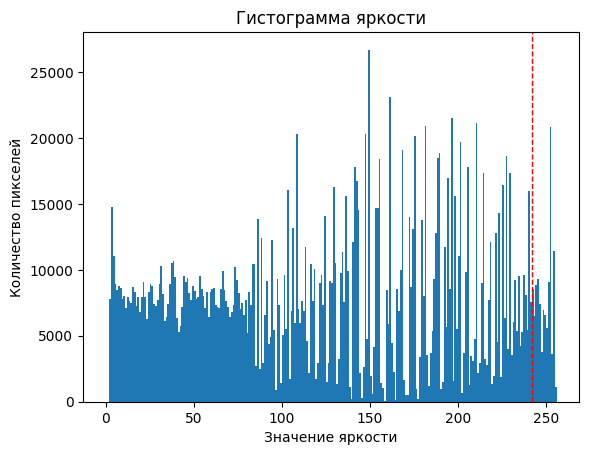

In [55]:
gray_image = cv2.cvtColor(image_uniform_transformation, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.axvline(x=242, color='red', linestyle='--', linewidth=1, label='242')
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

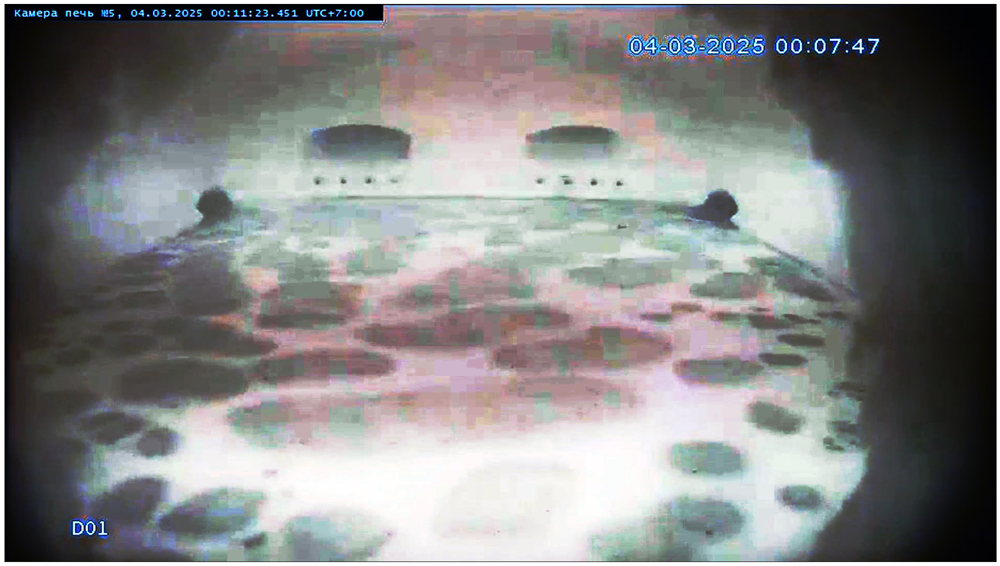

In [56]:
# Изображение после равномерного преобразования интенсивностей
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_uniform_transformation, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [57]:
# Применение экспоненциального преобразования
@njit(parallel=export_parallel)
def apply_exponential_hist(image, cumulative_hist, alpha):
    Imin = [np.min(image[:,:,i]) for i in range(image.shape[2])]
    image_new = np.zeros(image.shape, dtype="uint8")
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                Inew = Imin[i] - 255.0 * (1 / alpha) * log(1 - cumulative_hist[i][image[y][x][i]])
                if Inew < 0:
                    Inew = 0
                if Inew > 255:
                    Inew = 255
                image_new[y][x][i] = int(round(Inew))
    return image_new

In [58]:
image_cumulative_hist = calc_cumulative_hist(image)
image_cumulative_hist = image_cumulative_hist.astype(dtype=np.float64) / (image.shape[0] * image.shape[1])
image_exponential_transformation = apply_exponential_hist(image, image_cumulative_hist, alpha=5)
hist_exponential_transformation = calc_hist(image_exponential_transformation)


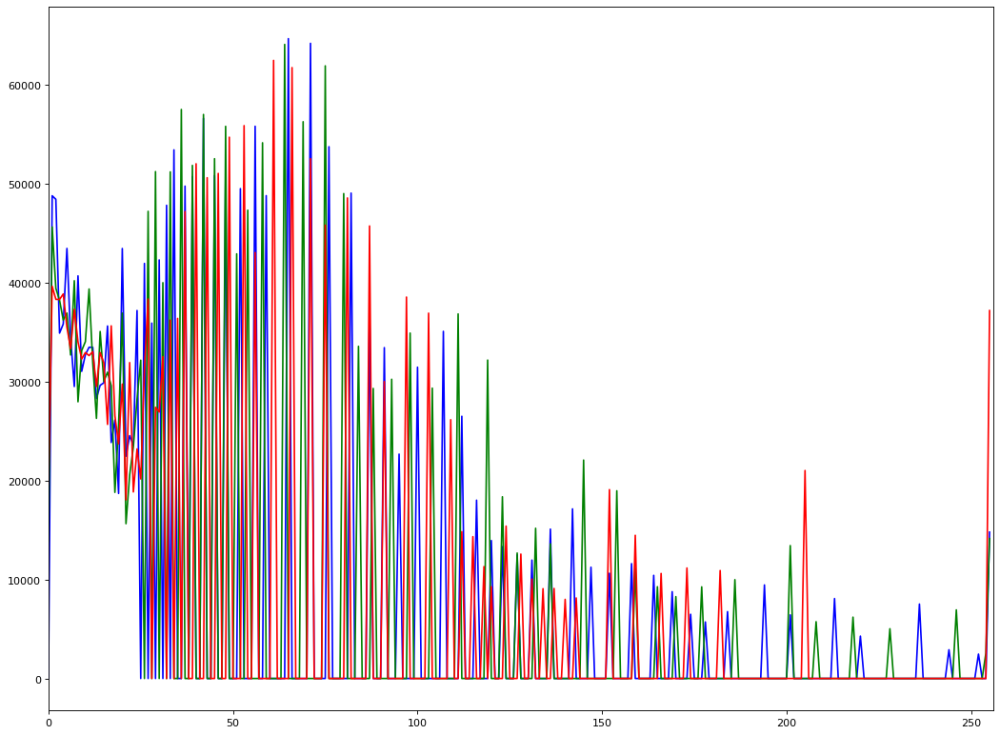

In [59]:
# Отображу полученную после экспоненциального преобразования интенсивностей гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_exponential_transformation[i], color = col)
    plt.xlim([0,256])

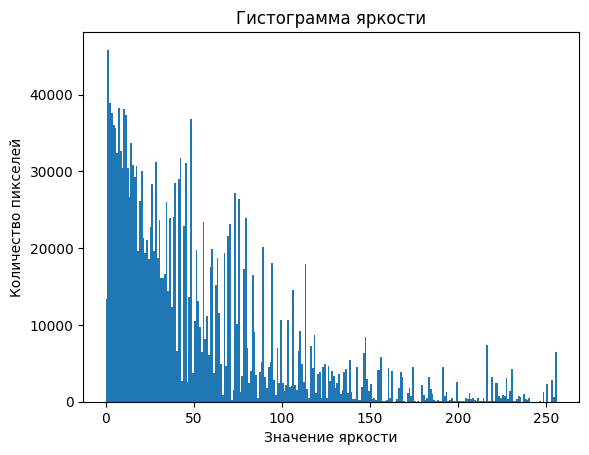

In [60]:
gray_image = cv2.cvtColor(image_exponential_transformation, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

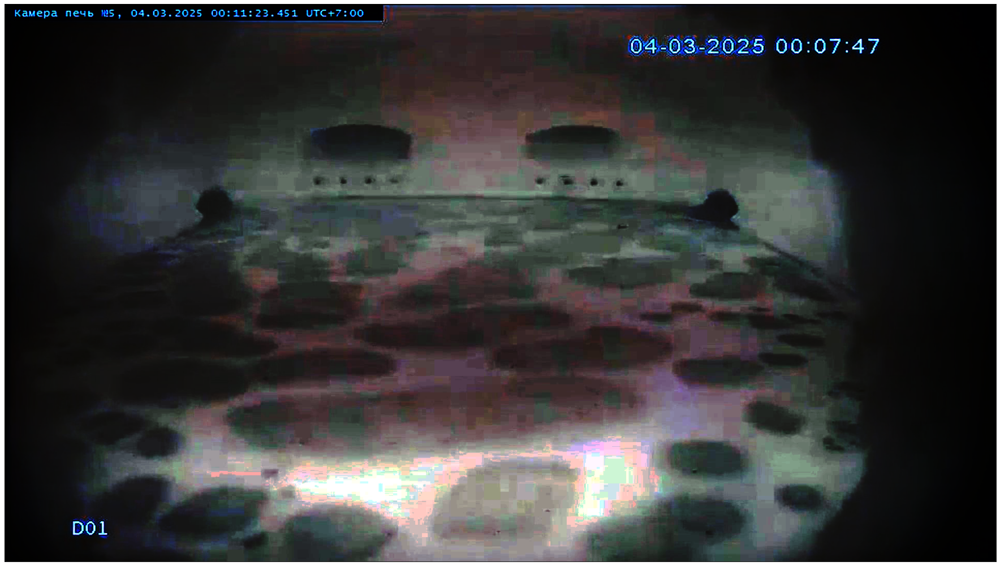

In [61]:
# Изображение после экспоненциального преобразования интенсивностей
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_exponential_transformation, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()
    image_bgr = cv2.cvtColor(image_exponential_transformation, cv2.COLOR_RGB2BGR)
    cv2.imwrite('output.jpg', image_bgr)

In [62]:
# Применение преобразования Рэлея
@njit(parallel=export_parallel)
def apply_Rayleigh_hist(image, cumulative_hist, alpha):
    Imin = [np.min(image[:,:,i]) for i in range(image.shape[2])]
    image_new = np.zeros(image.shape, dtype="uint8")
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                Inew = Imin[i] + 255.0 * pow((2 * pow(alpha, 2) * log(1 / (1 + 1e-9 - cumulative_hist[i][image[y][x][i]]))), 0.5)
                if Inew < 0:
                    Inew = 0
                if Inew > 255:
                    Inew = 255
                image_new[y][x][i] = int(round(Inew))
    return image_new

In [63]:
image_cumulative_hist = calc_cumulative_hist(image)
image_cumulative_hist = image_cumulative_hist.astype(dtype=np.float64) / (image.shape[0] * image.shape[1])
image_Rayleigh_transformation = apply_Rayleigh_hist(image, image_cumulative_hist, alpha=0.2)
hist_Rayleigh_transformation = calc_hist(image_Rayleigh_transformation)

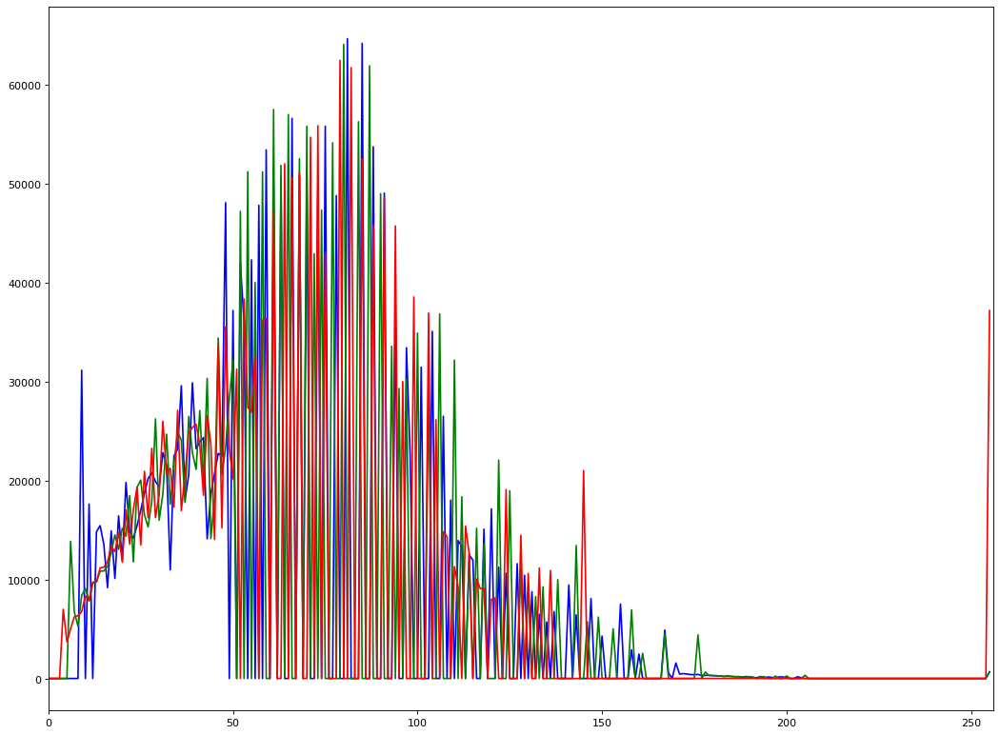

In [64]:
# Отображу полученную после преобразования Рэлея гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_Rayleigh_transformation[i], color = col)
    plt.xlim([0,256])

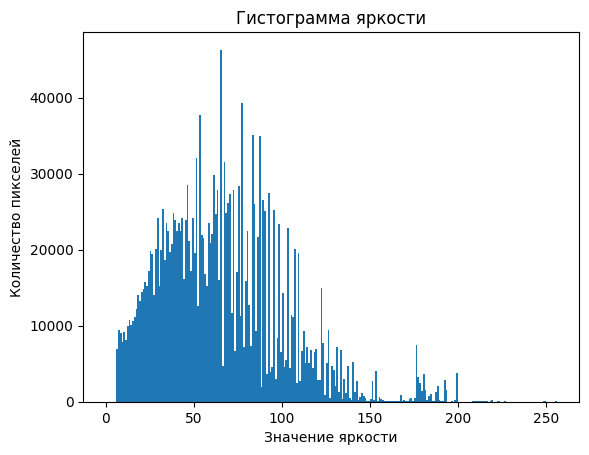

In [65]:
gray_image = cv2.cvtColor(image_Rayleigh_transformation, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

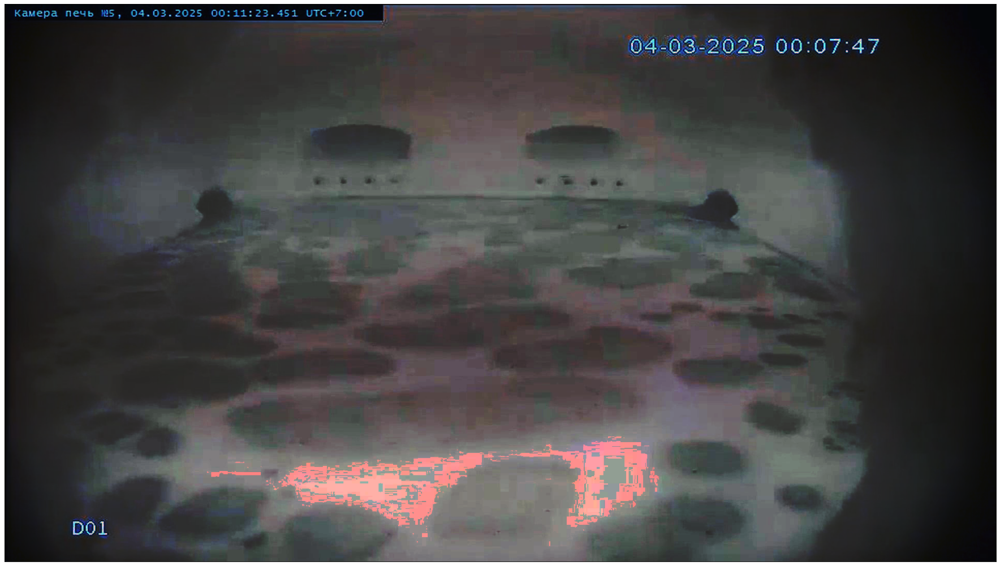

In [66]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_Rayleigh_transformation, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [67]:
# Применение преобразования по закону степени 2/3
@njit(parallel=export_parallel)
def apply_pow_2_3_hist(image, cumulative_hist):
    image_new = np.zeros(image.shape, dtype="uint8")
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                Inew = 255.0 * pow(cumulative_hist[i][image[y][x][i]], 2 / 3)
                if Inew < 0:
                    Inew = 0
                if Inew > 255:
                    Inew = 255
                image_new[y][x][i] = int(round(Inew))
    return image_new

In [68]:
image_cumulative_hist = calc_cumulative_hist(image)
image_cumulative_hist = image_cumulative_hist.astype(dtype=np.float64) / (image.shape[0] * image.shape[1])
image_pow_2_3_transformation = apply_pow_2_3_hist(image, image_cumulative_hist)
hist_pow_2_3_transformation = calc_hist(image_pow_2_3_transformation)

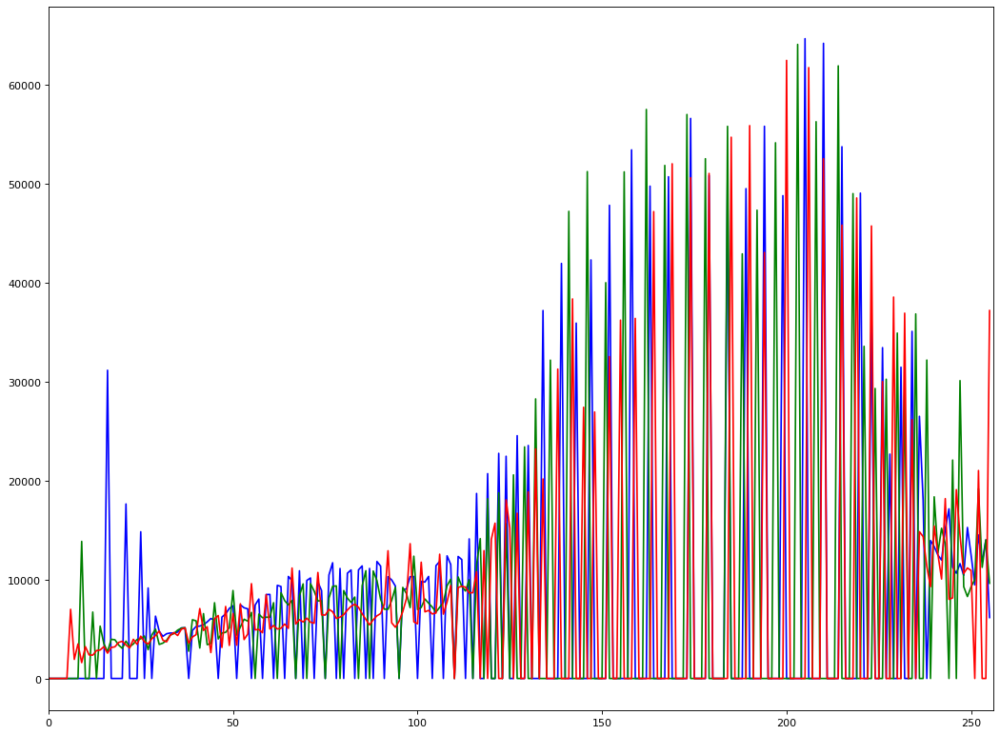

In [69]:
# Отображу полученную после преобразования по закону степени 2/3 гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_pow_2_3_transformation[i], color = col)
    plt.xlim([0,256])

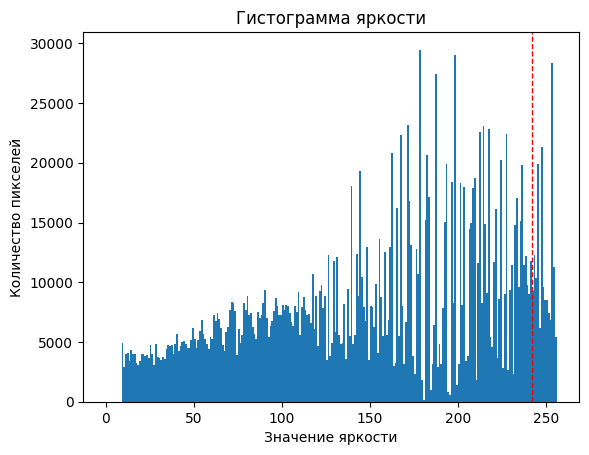

In [70]:
gray_image = cv2.cvtColor(image_pow_2_3_transformation, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.axvline(x=242, color='red', linestyle='--', linewidth=1, label='242')
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

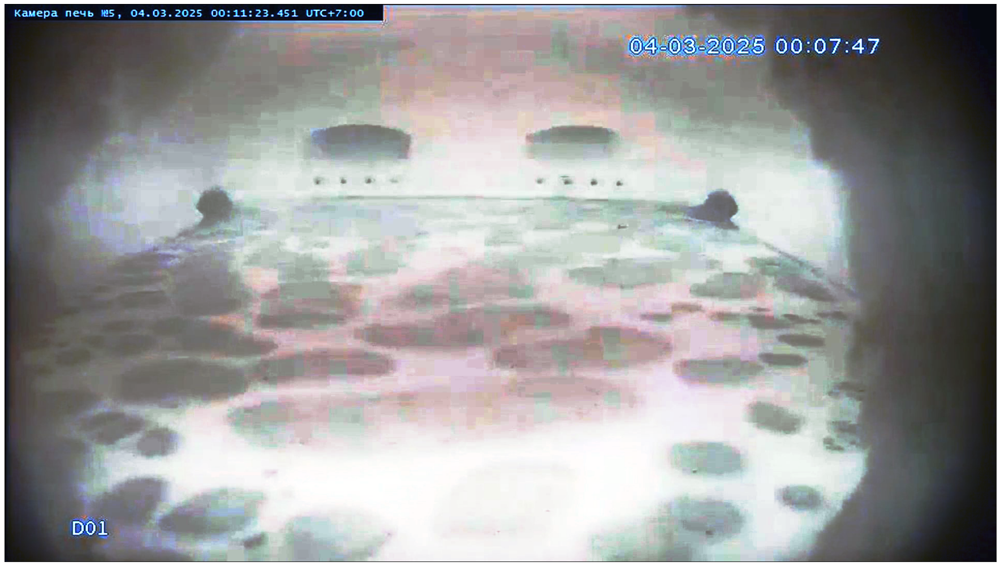

In [71]:
# Изображение после преобразования по закону степени 2/3
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_pow_2_3_transformation, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [72]:
# Применение гиперболического преобразования
@njit(parallel=export_parallel)
def apply_hyperbolic_hist(image, cumulative_hist, alpha_bias=0):
    alpha = [np.min(image[:,:,i]) for i in range(image.shape[2])]
    image_new = np.zeros(image.shape, dtype="uint8")
    for i in range(image.shape[2]):
        for y in range(image.shape[0]):
            for x in range(image.shape[1]):
                Inew = 255.0 * pow(alpha[i] + alpha_bias, cumulative_hist[i][image[y][x][i]])
                if Inew < 0:
                    Inew = 0
                if Inew > 255:
                    Inew = 255
                image_new[y][x][i] = int(round(Inew))
    return image_new

In [73]:
image_cumulative_hist = calc_cumulative_hist(image)
image_cumulative_hist = image_cumulative_hist.astype(dtype=np.float64) / (image.shape[0] * image.shape[1])
image_hyperbolic_transformation = apply_hyperbolic_hist(image, image_cumulative_hist, alpha_bias=0.01)
hist_hyperbolic_transformation = calc_hist(image_hyperbolic_transformation)

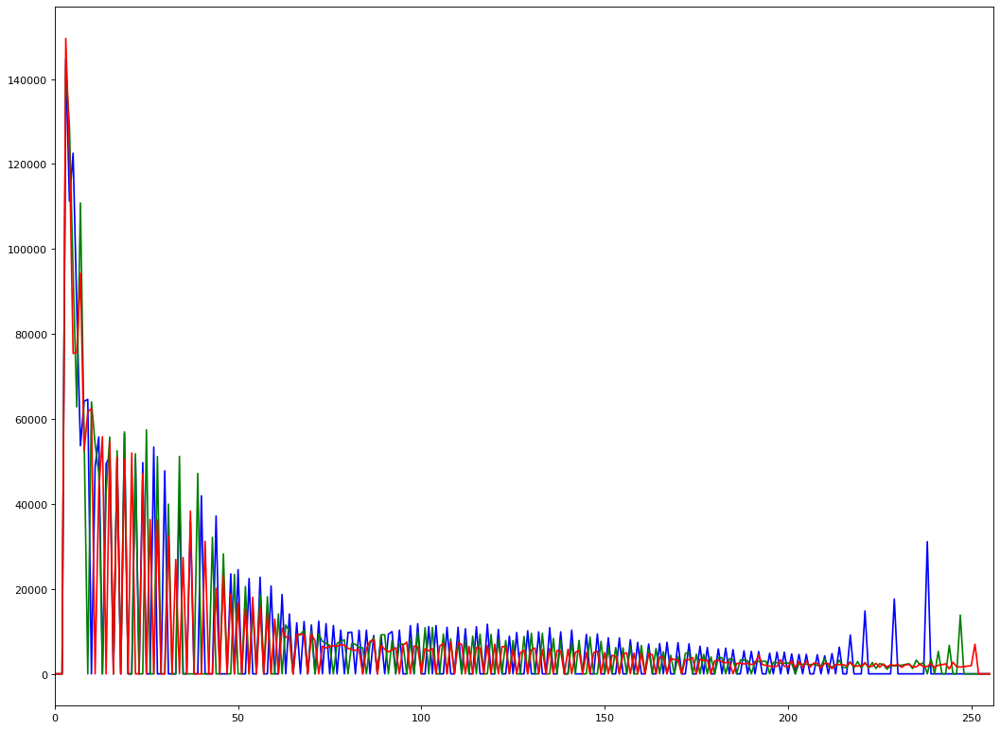

In [74]:
# Отображу полученную после гиперболического преобразования гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_hyperbolic_transformation[i], color = col)
    plt.xlim([0,256])

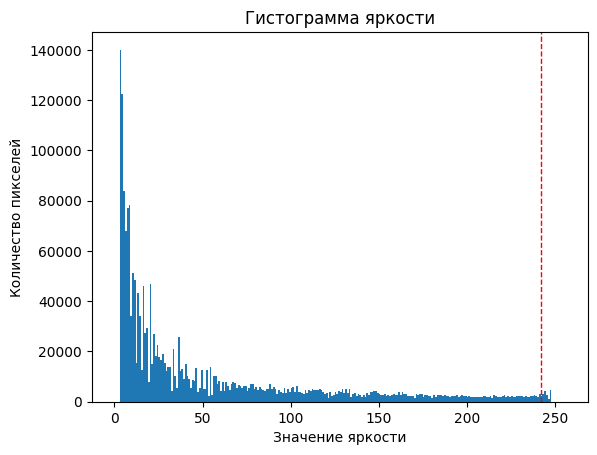

In [75]:
gray_image = cv2.cvtColor(image_hyperbolic_transformation, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.axvline(x=242, color='red', linestyle='--', linewidth=1, label='242')
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

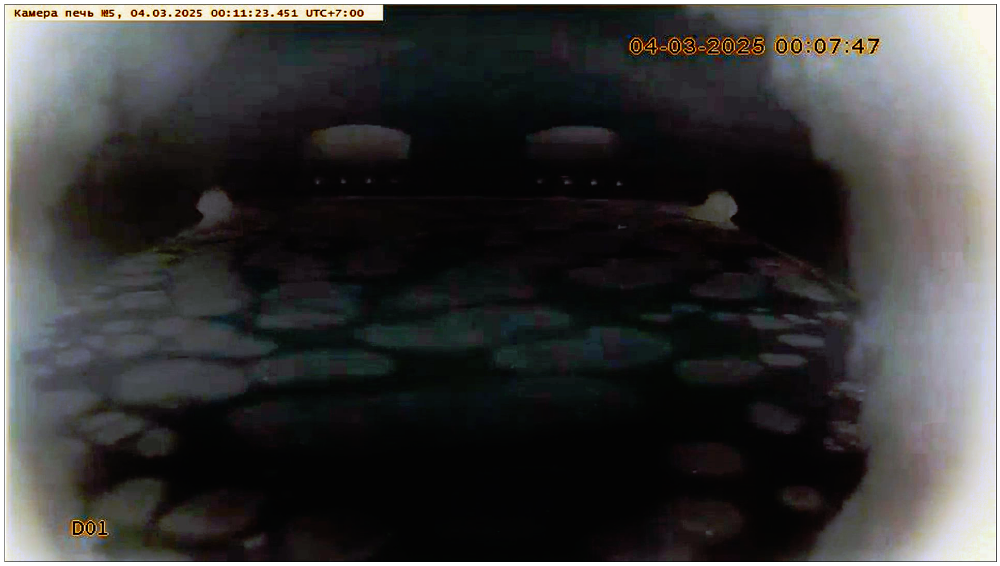

In [76]:
# Изображение после гиперболического преобразования
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_hyperbolic_transformation, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [77]:
"""
Made by ashkan from
https://stackoverflow.com/questions/39767612/what-is-the-equivalent-of-matlabs-imadjust-in-python
"""

def imadjust(x,a,b,c,d,gamma=1):
    # Similar to imadjust in MATLAB.
    # Converts an image range from [a,b] to [c,d].
    # The Equation of a line can be used for this transformation:
    #   y=((d-c)/(b-a))*(x-a)+c
    # However, it is better to use a more generalized equation:
    #   y=((x-a)/(b-a))^gamma*(d-c)+c
    # If gamma is equal to 1, then the line equation is used.
    # When gamma is not equal to 1, then the transformation is not linear.

    y = (((x - a) / (b - a)) ** gamma) * (d - c) + c
    return y


def imadjust_rgb(image):
    image = 255 * imadjust(image,image.min(),image.max(),0,1)
    image = image.astype("uint8")
    return image

In [78]:
# imadjust
image_imadjust = imadjust_rgb(image)
hist_imadjust = calc_hist(image_imadjust)

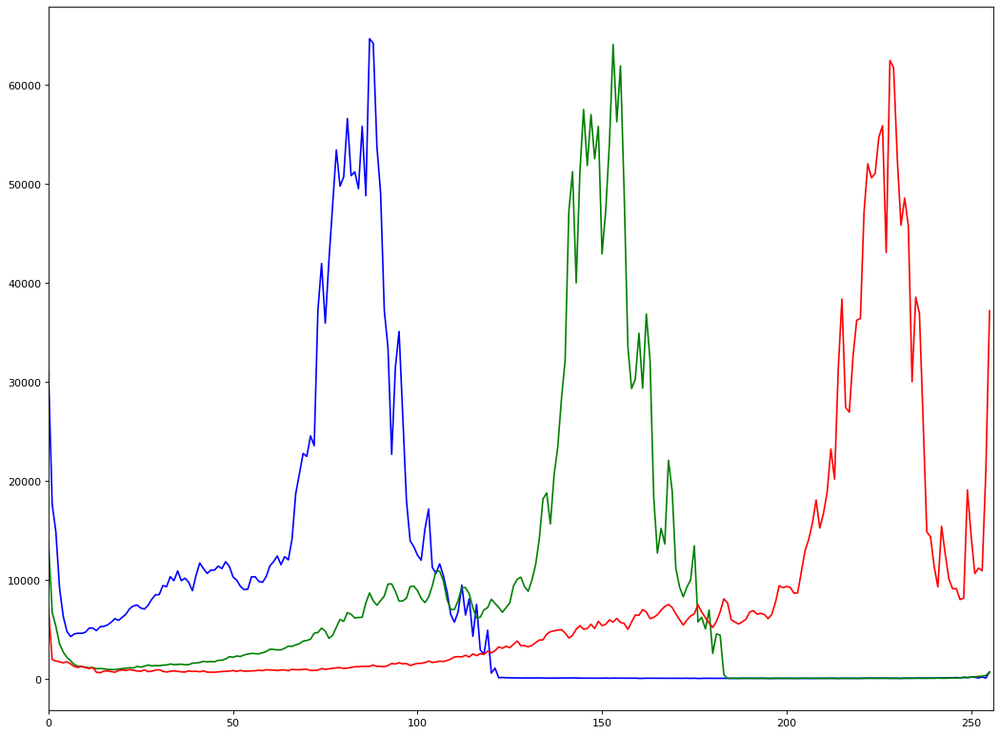

In [79]:
# Отображу полученную после imadjust гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_imadjust[i], color = col)
    plt.xlim([0,256])

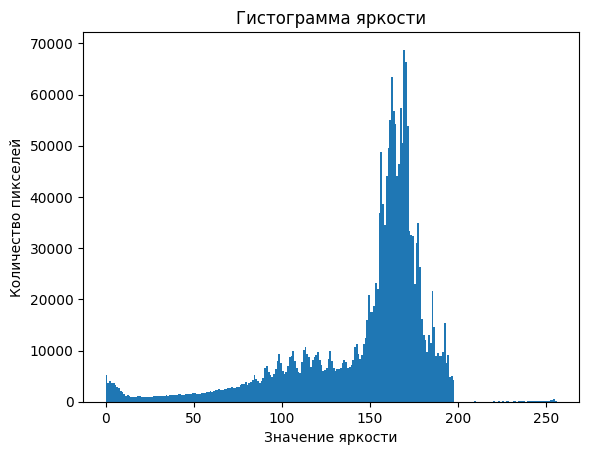

In [80]:
gray_image = cv2.cvtColor(image_imadjust, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

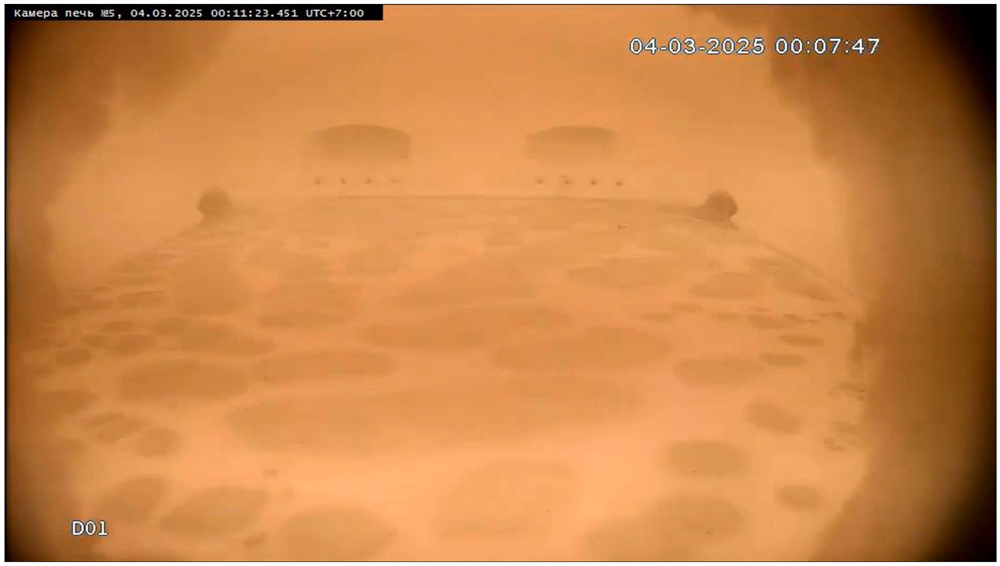

In [81]:
# Изображение после imadjust
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_imadjust, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [82]:
# equalizeHist
channels = list(cv2.split(image))  # Преобразуем кортеж в список
for i in range(len(channels)):
    channels[i] = cv2.equalizeHist(channels[i])
image_equalizeHist = cv2.merge(channels)  # Собираем изображение обратно
hist_equalizeHist = calc_hist(image_equalizeHist)

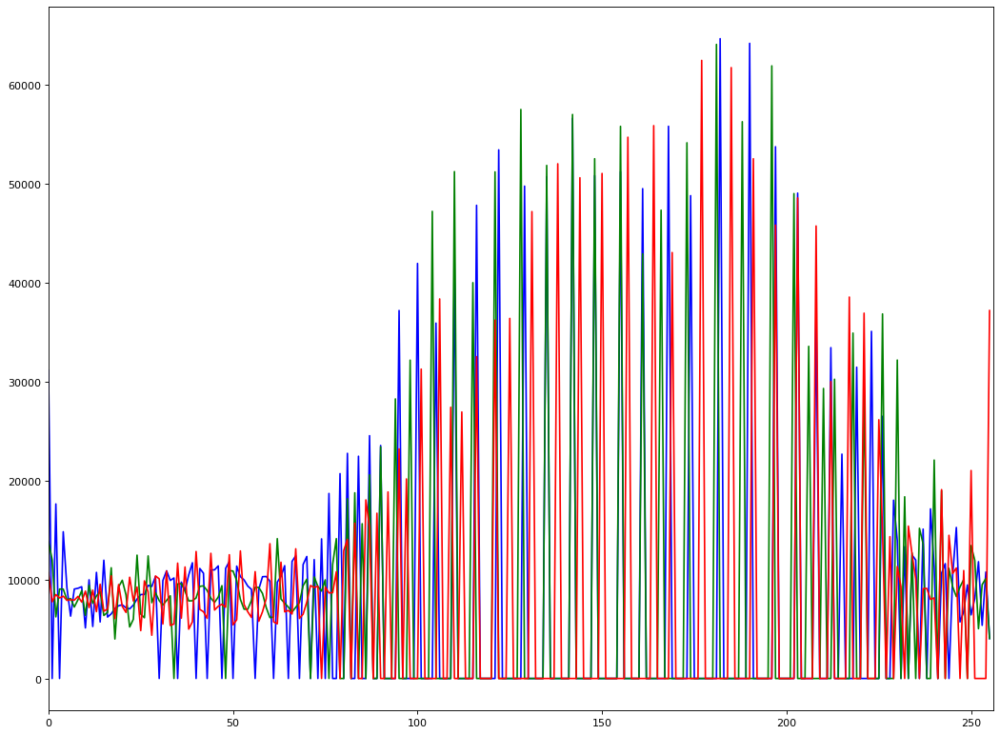

In [83]:
# Отображу полученную после equalizeHist гистограмму
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_equalizeHist[i], color = col)
    plt.xlim([0,256])

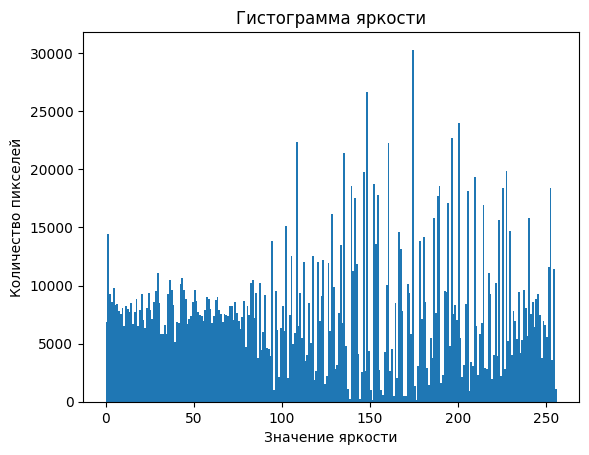

In [84]:
gray_image = cv2.cvtColor(image_equalizeHist, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

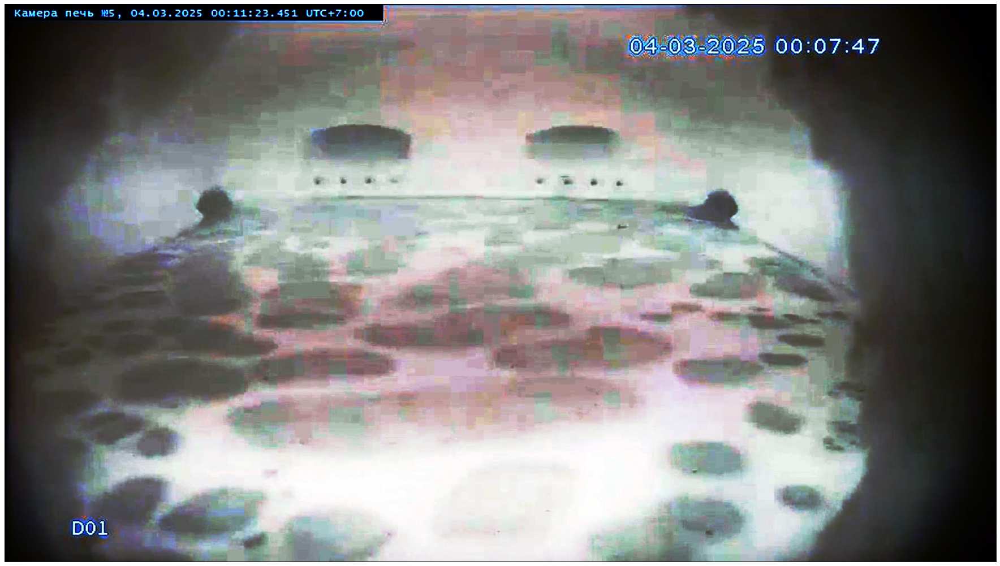

In [86]:
# Изображение после equalizeHist
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image_equalizeHist, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()
    gray_equalizeHist = cv2.cvtColor(image_equalizeHist, cv2.COLOR_RGB2GRAY)
    cv2.imwrite('output_HIST_gray.jpg', gray_equalizeHist)

In [87]:
# CLAHE
clahe = cv2.createCLAHE(clipLimit=6.0, tileGridSize=(16,16))
channels = list(cv2.split(image))
for i in range(len(channels)):
    channels[i] = clahe.apply(channels[i])
image_CLAHE = cv2.merge(channels)
hist_CLAHE = calc_hist(image_CLAHE)

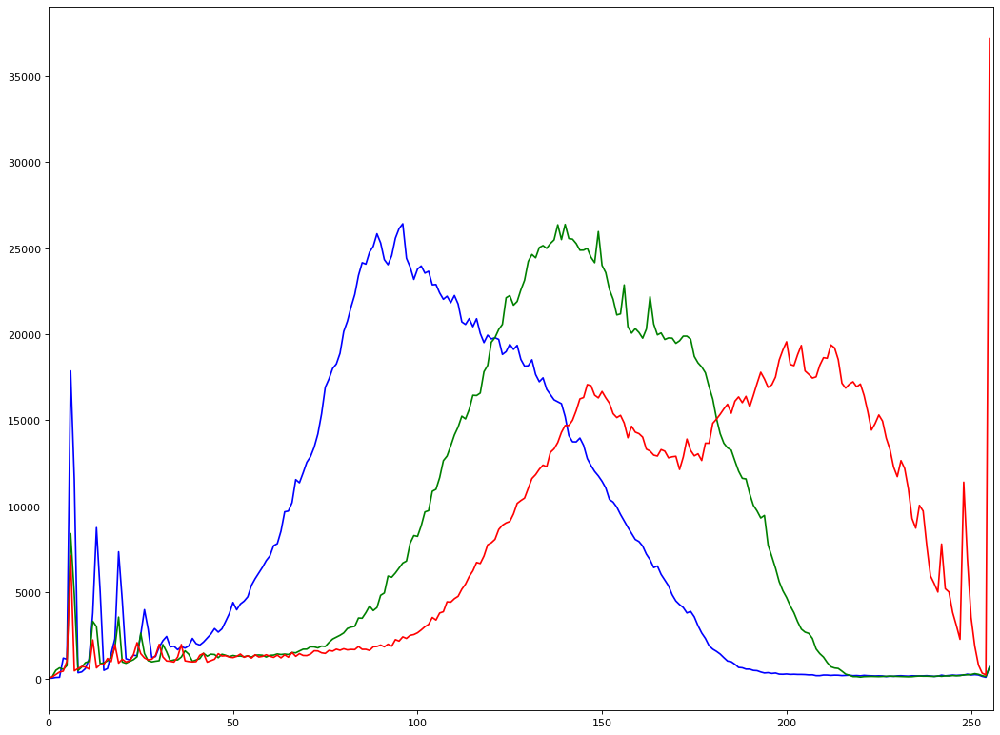

In [88]:
if use_graph:
    color = ('b','g','r')
    figure(figsize=(16, 12), dpi=80)
    for i, col in enumerate(color):
        plt.plot(hist_CLAHE[i], color = col)
    plt.xlim([0,256])

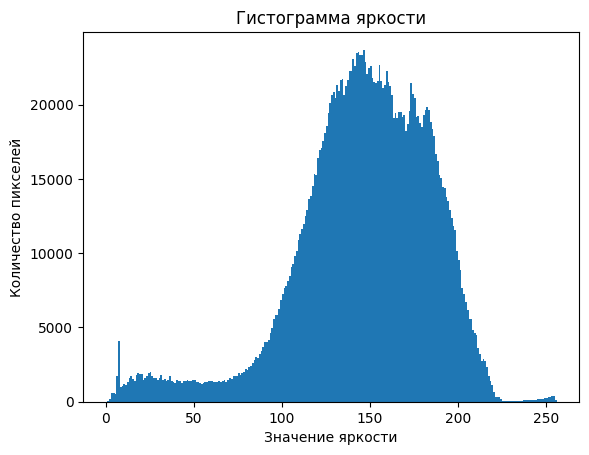

In [89]:
gray_image = cv2.cvtColor(image_CLAHE, cv2.COLOR_BGR2GRAY)
# Построение гистограммы
plt.hist(gray_image.ravel(), bins=256, range=[0, 256])
plt.title('Гистограмма яркости')
plt.xlabel('Значение яркости')
plt.ylabel('Количество пикселей')
plt.show()

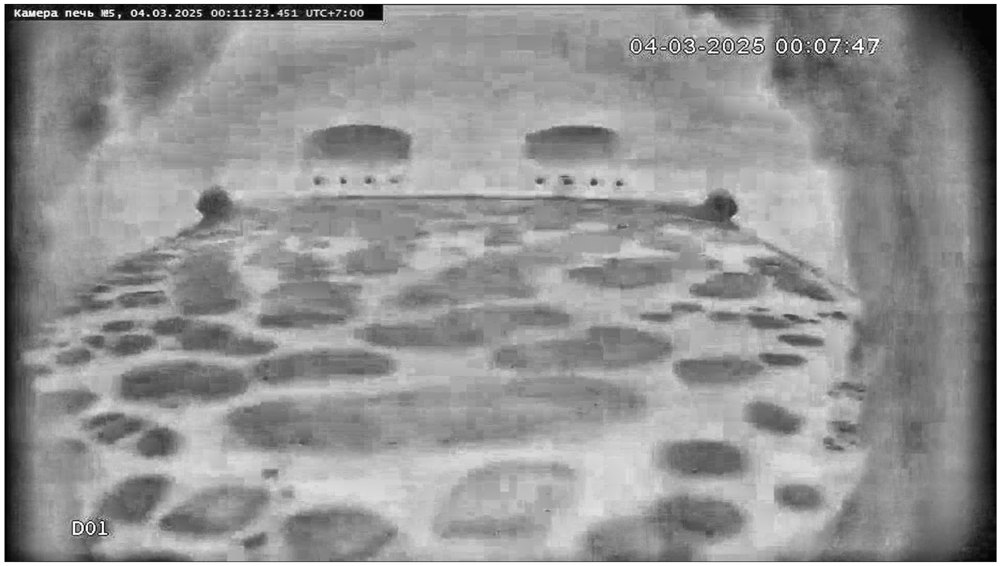

In [90]:
# Изображение после CLAHE
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    gray_CLAHE = cv2.cvtColor(image_CLAHE, cv2.COLOR_BGR2GRAY)
    plt.imshow(cv2.cvtColor(image_CLAHE, cv2.COLOR_BGR2GRAY))
    plt.imshow(gray_CLAHE, cmap='gray')
    plt.xticks([]),plt.yticks([])
    plt.show()
    cv2.imwrite('output_CLAHE_gray.jpg', gray_CLAHE)